In [190]:
using Pkg
Pkg.activate("C:/Users/lisah/Documents/Repos/ma-code")
include("c:/Users/lisah/Documents/Repos/ma-code/src/src.jl")
using .Src

  Activating project at `C:\Users\lisah\Documents\Repos\ma-code`


In [191]:
# set true model parameters
a_true = 0.9 # at bifurcation point
m_true = 0.45
n0 = 1.5
w0 = 0.2
M = 100 # number of measurements
noise = 0.5

# create parameter object for trial
hprm = Hyperprm(w0, n0, a_true, m_true, M, noise);

## fixed time window, observe from t=0

In [192]:
# observation time window fixed
t_fixed = true

true

### infer a,m

In [193]:
# infer a,m parameter
prm_keys = [:a, :m];

In [194]:
# inverse uq and practical identifiability
r = assess_practical_identifiability(prm_keys, hprm, t_fixed=t_fixed)

(mle = [0.9792973948984192, 0.4907540448712875], plot_mles = Plot{Plots.GRBackend() n=12}, plot_losses = Plot{Plots.GRBackend() n=3}, cor = [1.0 0.999893499576331; 0.999893499541946 1.0], cov = [0.022094279698860315 0.01095862370688522; 0.010958623706508366 0.005436566335282736], gaussian_heatmap = Plot{Plots.GRBackend() n=1}, gaussian_surface = Plot{Plots.GRBackend() n=2})

In [195]:
# forward uq
rf = forward_uq(r.mle, r.cov, prm_keys, [a_true, m_true], t_fixed=t_fixed)

(trajectories = Plot{Plots.GRBackend() n=204}, sample_dens_n = Plot{Plots.GRBackend() n=2}, sample_dens_w = Plot{Plots.GRBackend() n=2})

### analyze plots

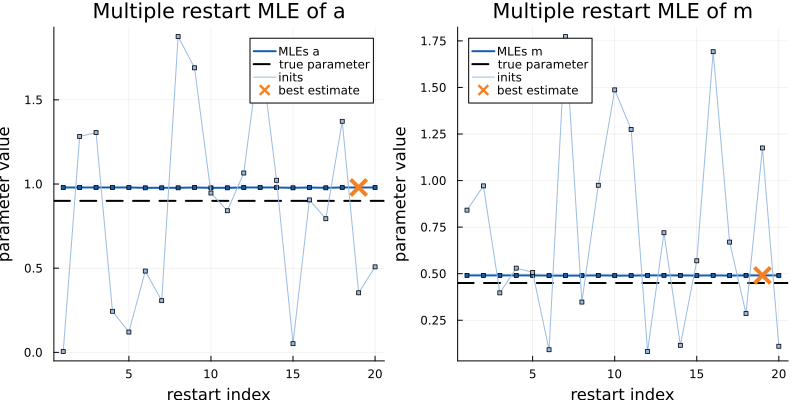

In [196]:
r.plot_mles

In [197]:
r.cor

2×2 Matrix{Float64}:
 1.0       0.999893
 0.999893  1.0

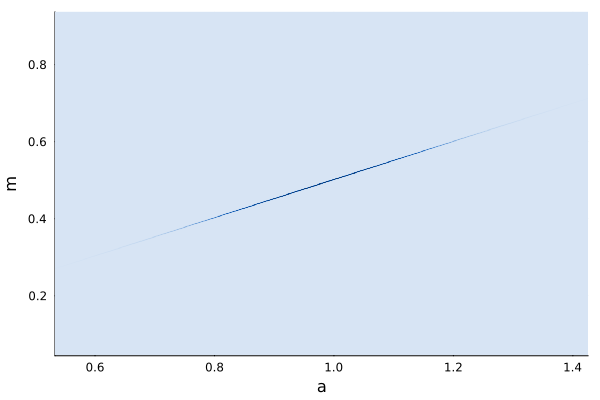

In [198]:
r.gaussian_heatmap

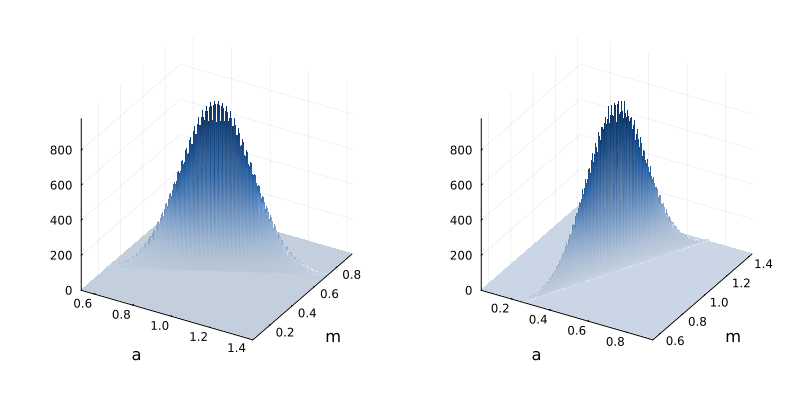

In [199]:
r.gaussian_surface

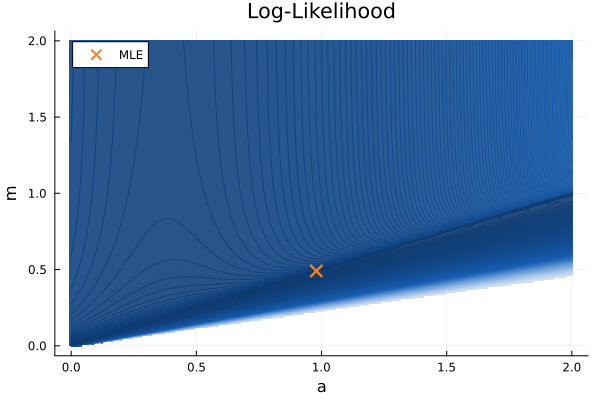

In [200]:
analyze_ll(r.mle, prm_keys, hprm, -1000, t_fixed=t_fixed)

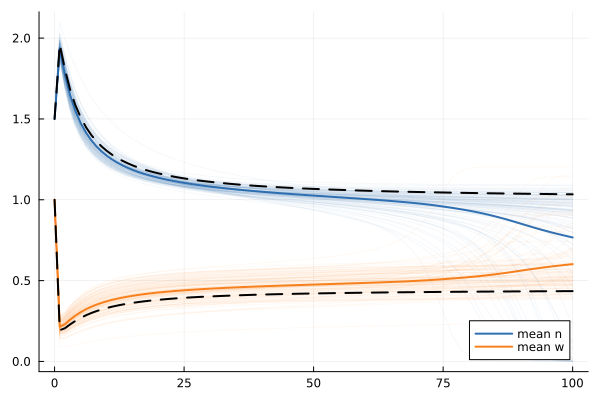

In [201]:
rf.trajectories

### infer a

In [202]:
prm_keys= [:a];

In [203]:
# inverse uq and practica identifiability
r = assess_practical_identifiability(prm_keys, hprm, t_fixed=t_fixed)

# forward uq
rf = forward_uq(r.mle, r.cov, prm_keys, [a_true, m_true], t_fixed=t_fixed)

(trajectories = Plot{Plots.GRBackend() n=204}, sample_dens_n = Plot{Plots.GRBackend() n=2}, sample_dens_w = Plot{Plots.GRBackend() n=2})

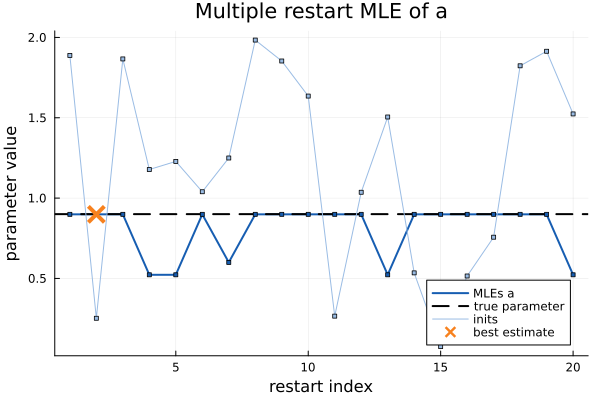

In [204]:
r.plot_mles

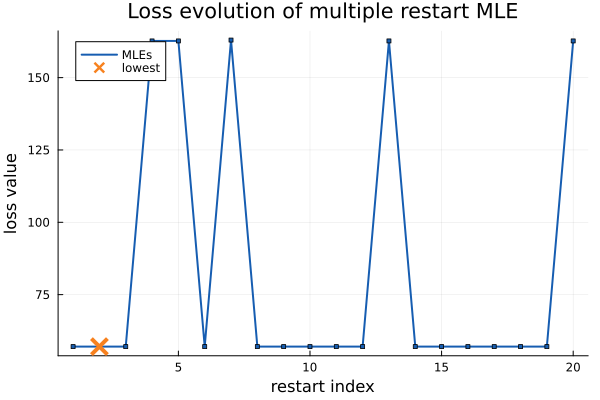

In [205]:
r.plot_losses

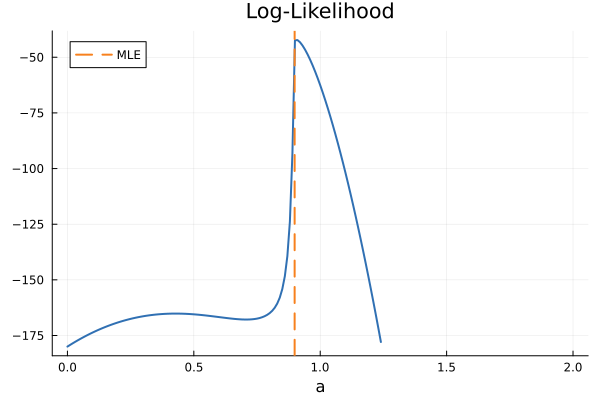

In [206]:
analyze_ll(r.mle,prm_keys, hprm, -180, t_fixed=t_fixed)

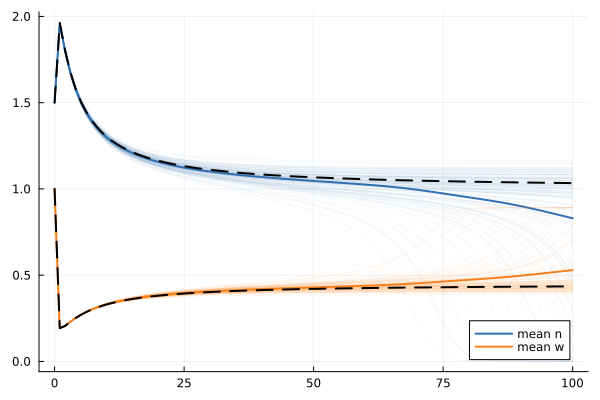

In [207]:
rf.trajectories

In [208]:
r.cov

1×1 Matrix{Float64}:
 1.4587641844659291e-5

## fixed time window, observe stable state only

In [209]:
# observation time window fixed
t_fixed = true

# observations in stable state only
obs_late = true
t_end = 200.0; # observe system for a longer time in this case

### infer a,m

In [210]:
# infer a,m parameter
prm_keys = [:a, :m];

In [211]:
# inverse uq and practica identifiability
r = assess_practical_identifiability(prm_keys, hprm, t_fixed=t_fixed, obs_late=obs_late, t_end=t_end)

# forward uq
rf = forward_uq(r.mle, r.cov, prm_keys, [a_true, m_true], t_fixed=t_fixed, t_end=t_end)


(trajectories = Plot{Plots.GRBackend() n=204}, sample_dens_n = Plot{Plots.GRBackend() n=2}, sample_dens_w = Plot{Plots.GRBackend() n=2})

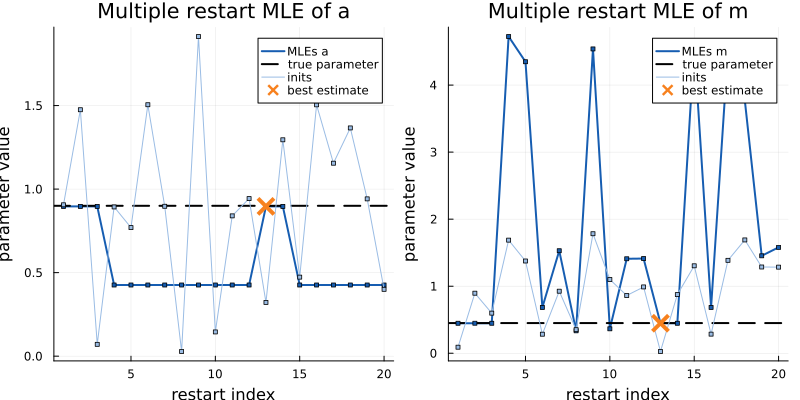

In [212]:
r.plot_mles

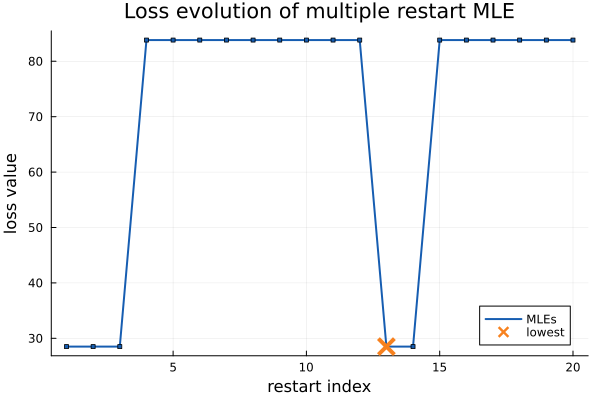

In [213]:
r.plot_losses

In [214]:
r.cor

2×2 Matrix{Float64}:
 1.0       0.999824
 0.999824  1.0

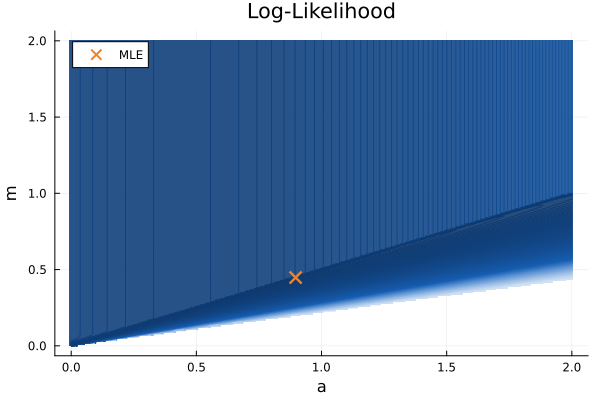

In [215]:
analyze_ll(r.mle, prm_keys, hprm,-600, t_fixed=t_fixed,obs_late=obs_late,t_end=200.0)

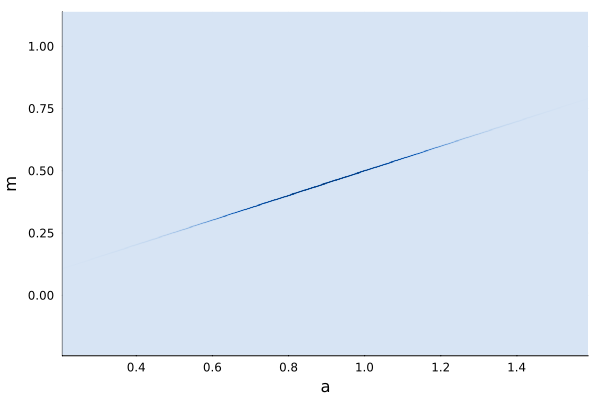

In [216]:
r.gaussian_heatmap

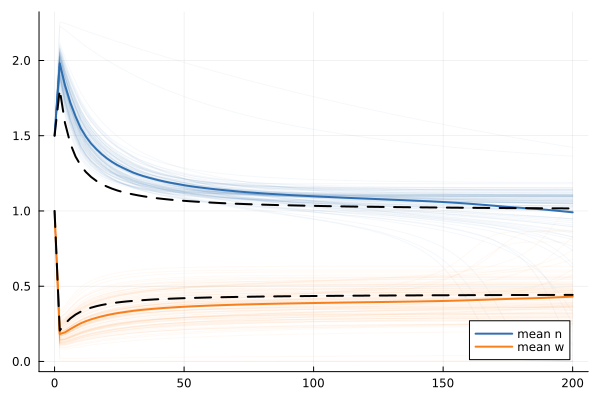

In [217]:
rf.trajectories

### infer a

In [218]:
prm_keys = [:a];

In [219]:
# inverse uq and practica identifiability
r = assess_practical_identifiability(prm_keys, hprm, t_fixed=t_fixed, obs_late=obs_late, t_end=t_end)

# forward uq
rf = forward_uq(r.mle, r.cov, prm_keys, [a_true], t_fixed=t_fixed, t_end=t_end)

(trajectories = Plot{Plots.GRBackend() n=204}, sample_dens_n = Plot{Plots.GRBackend() n=2}, sample_dens_w = Plot{Plots.GRBackend() n=2})

In [226]:
r.cov

1×1 Matrix{Float64}:
 6.667658617277562e-7

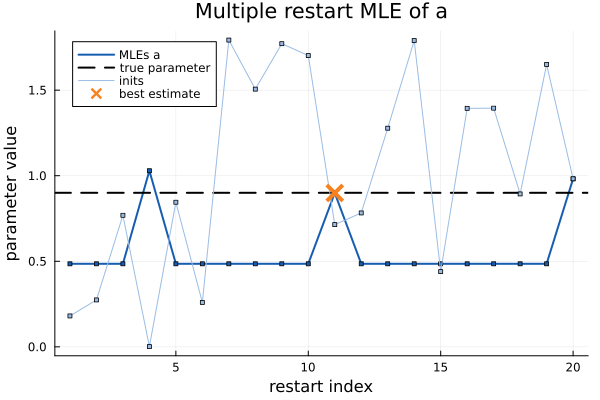

In [220]:
r.plot_mles

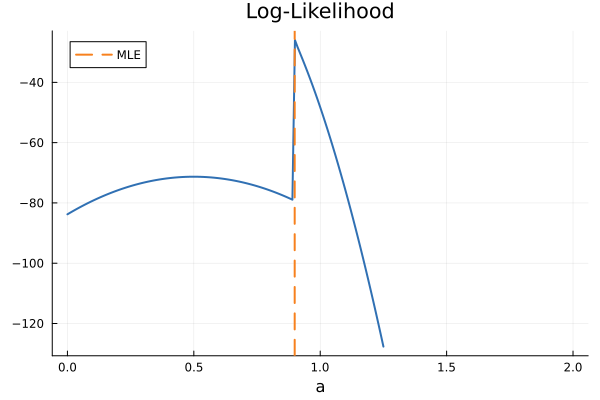

In [221]:
analyze_ll(r.mle, prm_keys, hprm,-130, t_fixed=t_fixed,obs_late=obs_late, t_end=200.0)

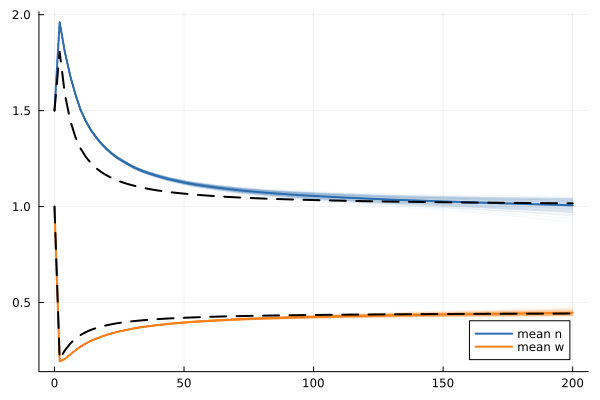

In [222]:
rf.trajectories